# 1

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

dmt = pd.read_csv('dmt.csv')
dmt

,Date,Daily temperatures
0,1981-01-01,20.7
1,1981-01-02,17.9
2,1981-01-03,18.8
3,1981-01-04,14.6
4,1981-01-05,15.8
...,...,...
3645,1990-12-27,14.0
3646,1990-12-28,13.6
3647,1990-12-29,13.5
3648,1990-12-30,15.7


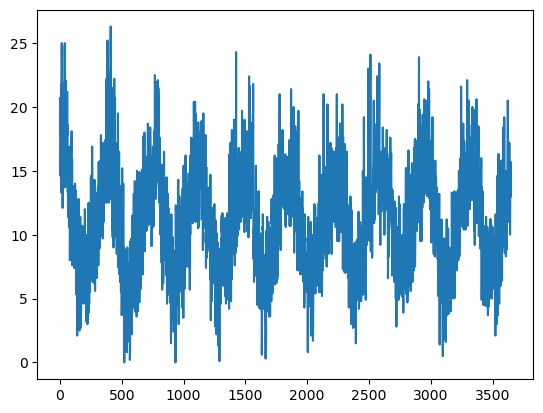

In [2]:
x = np.arange(len(dmt))
y = np.array((dmt['Daily temperatures'].to_list()))

fig, ax = plt.subplots()
ax.plot(x, y)
plt.show()

/tmp/ipykernel_6479/4171155334.py:5: RuntimeWarning: invalid value encountered in double_scalars
  y_hat.append(y[i-hp:i].sum()*1/hp)


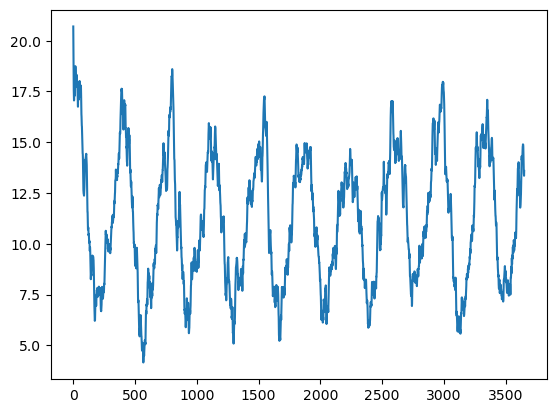

In [3]:
def f_avg(y,hop):
    y_hat = []
    for i in range(len(y)):
        hp = min(i,hop)
        y_hat.append(y[i-hp:i].sum()*1/hp)
    y_hat = np.array(y_hat)
    return y_hat

y_hat = f_avg(y,20)
fig, ax = plt.subplots()
ax.plot(x, y_hat)
plt.show()


# 2

In [4]:
w = pd.read_csv('w.data', header = None)
w

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,1,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065
1,1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
2,1,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
3,1,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480
4,1,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,3,13.71,5.65,2.45,20.5,95,1.68,0.61,0.52,1.06,7.70,0.64,1.74,740
174,3,13.40,3.91,2.48,23.0,102,1.80,0.75,0.43,1.41,7.30,0.70,1.56,750
175,3,13.27,4.28,2.26,20.0,120,1.59,0.69,0.43,1.35,10.20,0.59,1.56,835
176,3,13.17,2.59,2.37,20.0,120,1.65,0.68,0.53,1.46,9.30,0.60,1.62,840


In [5]:
w_cut = w.iloc[:,:3]
w_cut

,0,1,2
0,1,14.23,1.71
1,1,13.20,1.78
2,1,13.16,2.36
3,1,14.37,1.95
4,1,13.24,2.59
...,...,...,...
173,3,13.71,5.65
174,3,13.40,3.91
175,3,13.27,4.28
176,3,13.17,2.59


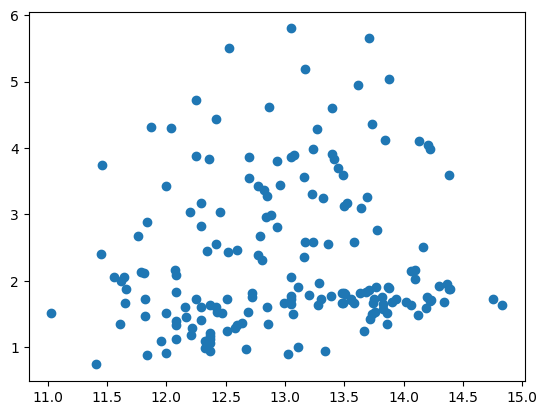

In [6]:
x = np.array(w_cut[1].to_list())
y = np.array(w_cut[2].to_list())

fig, ax = plt.subplots()
ax.scatter(x, y)
plt.show()

In [7]:
w_cut_st = w_cut.copy()
w_cut_st[[1,2]] = w_cut_st[[1,2]].apply(lambda x: (x - x.mean()) / x.std() if x.std() != 0 else x, axis=0)

w_cut_mnmx = w_cut.copy()
w_cut_mnmx[[1,2]] = (w_cut_mnmx[[1,2]] - w_cut_mnmx[[1,2]].min()) / (w_cut_mnmx[[1,2]].max() - w_cut_mnmx[[1,2]].min())

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


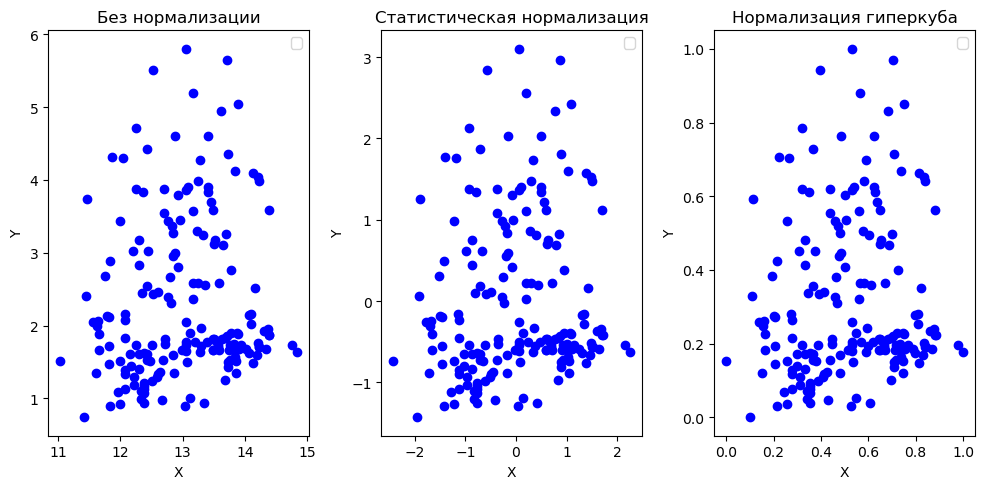

In [8]:
x_s = np.array(w_cut_st[1].to_list())
y_s = np.array(w_cut_st[2].to_list())

x_k = np.array(w_cut_mnmx[1].to_list())
y_k = np.array(w_cut_mnmx[2].to_list())

fig, axs = plt.subplots(1,3, figsize = (10,5))

axs[0].scatter(x, y, color='blue')
axs[0].set_title('Без нормализации')
axs[0].set_xlabel('X')
axs[0].set_ylabel('Y')
axs[0].legend()

axs[1].scatter(x_s, y_s, color='blue')
axs[1].set_title('Статистическая нормализация')
axs[1].set_xlabel('X')
axs[1].set_ylabel('Y')
axs[1].legend()

axs[2].scatter(x_k, y_k, color='blue')
axs[2].set_title('Нормализация гиперкуба')
axs[2].set_xlabel('X')
axs[2].set_ylabel('Y')
axs[2].legend()

plt.tight_layout()
plt.show()

In [9]:
labels = np.array(w_cut[0].to_list())
colors = np.where(labels == 1, 'blue', np.where(labels == 2, 'red', 'green'))

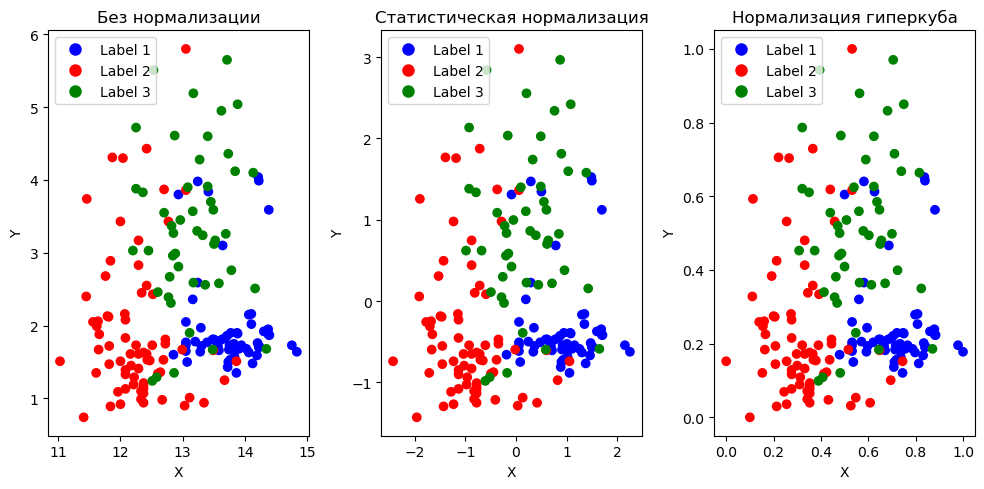

In [10]:
from matplotlib.lines import Line2D
x_s = np.array(w_cut_st[1].to_list())
y_s = np.array(w_cut_st[2].to_list())

x_k = np.array(w_cut_mnmx[1].to_list())
y_k = np.array(w_cut_mnmx[2].to_list())

fig, axs = plt.subplots(1,3, figsize = (10,5))

legend_elements = [
    Line2D([0], [0], marker='o', color='w', label='Label 1', markerfacecolor='blue', markersize=10),
    Line2D([0], [0], marker='o', color='w', label='Label 2', markerfacecolor='red', markersize=10),
    Line2D([0], [0], marker='o', color='w', label='Label 3', markerfacecolor='green', markersize=10)
]

axs[0].scatter(x, y, c=colors, label=['Label 1', 'Label 2', 'Label 3'])
axs[0].set_title('Без нормализации')
axs[0].set_xlabel('X')
axs[0].set_ylabel('Y')
axs[0].legend(handles=legend_elements)

axs[1].scatter(x_s, y_s, c=colors, label='Data Points')
axs[1].set_title('Статистическая нормализация')
axs[1].set_xlabel('X')
axs[1].set_ylabel('Y')
axs[1].legend(handles=legend_elements)

axs[2].scatter(x_k, y_k, c=colors, label='Data Points')
axs[2].set_title('Нормализация гиперкуба')
axs[2].set_xlabel('X')
axs[2].set_ylabel('Y')
axs[2].legend(handles=legend_elements)

plt.tight_layout()
plt.show()

In [14]:
l1 = np.where(labels == 1)
l2 = np.where(labels == 2)
l3 = np.where(labels == 3)

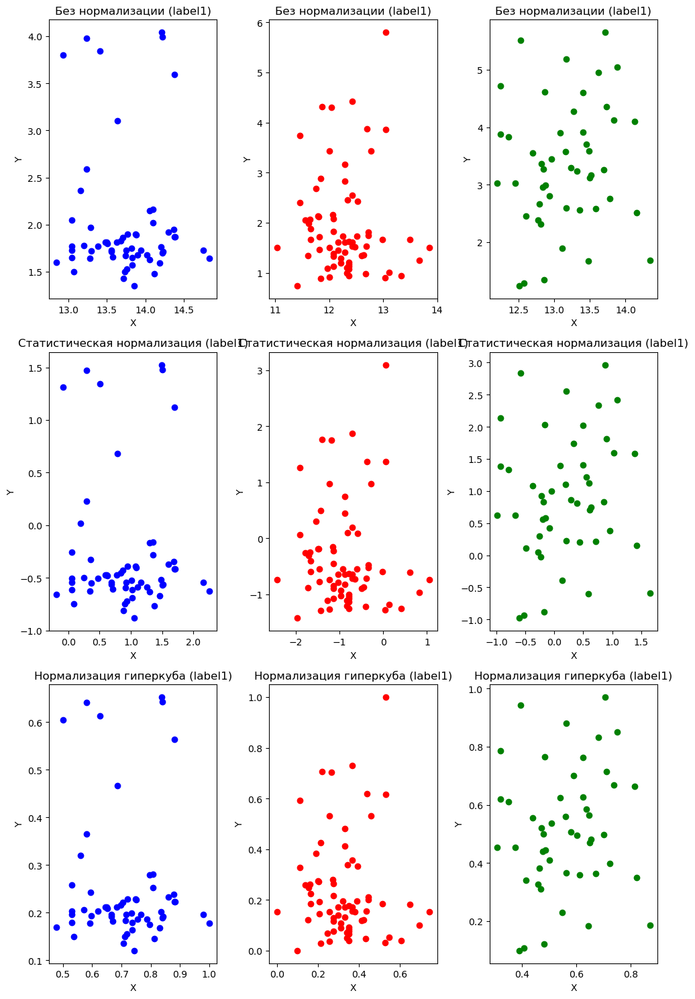

In [18]:
fig, axs = plt.subplots(3,3, figsize = (10,15))

axs[0,0].scatter(x[l1], y[l1], c='blue')
axs[0,0].set_title('Без нормализации (label1)')
axs[0,0].set_xlabel('X')
axs[0,0].set_ylabel('Y')

axs[0,1].scatter(x[l2], y[l2], c='red')
axs[0,1].set_title('Без нормализации (label1)')
axs[0,1].set_xlabel('X')
axs[0,1].set_ylabel('Y')

axs[0,2].scatter(x[l3], y[l3], c='green')
axs[0,2].set_title('Без нормализации (label1)')
axs[0,2].set_xlabel('X')
axs[0,2].set_ylabel('Y')

axs[1,0].scatter(x_s[l1], y_s[l1], c='blue')
axs[1,0].set_title('Статистическая нормализация (label1)')
axs[1,0].set_xlabel('X')
axs[1,0].set_ylabel('Y')

axs[1,1].scatter(x_s[l2], y_s[l2], c='red')
axs[1,1].set_title('Статистическая нормализация (label1)')
axs[1,1].set_xlabel('X')
axs[1,1].set_ylabel('Y')

axs[1,2].scatter(x_s[l3], y_s[l3], c='green')
axs[1,2].set_title('Статистическая нормализация (label1)')
axs[1,2].set_xlabel('X')
axs[1,2].set_ylabel('Y')

axs[2,0].scatter(x_k[l1], y_k[l1], c='blue')
axs[2,0].set_title('Нормализация гиперкуба (label1)')
axs[2,0].set_xlabel('X')
axs[2,0].set_ylabel('Y')

axs[2,1].scatter(x_k[l2], y_k[l2], c='red')
axs[2,1].set_title('Нормализация гиперкуба (label1)')
axs[2,1].set_xlabel('X')
axs[2,1].set_ylabel('Y')

axs[2,2].scatter(x_k[l3], y_k[l3], c='green')
axs[2,2].set_title('Нормализация гиперкуба (label1)')
axs[2,2].set_xlabel('X')
axs[2,2].set_ylabel('Y')

plt.tight_layout()
plt.show()

# 3

In [20]:
pca = pd.read_csv('pca.csv', header = None)
pca

,0,1
0,-0.625302,-0.170064
1,0.960695,0.590901
2,-0.598543,-0.402593
3,-2.228059,-0.532577
4,-0.461430,-0.498867
...,...,...
195,0.838409,0.278380
196,0.312708,-0.010600
197,1.955876,0.638224
198,-1.108304,-0.395054


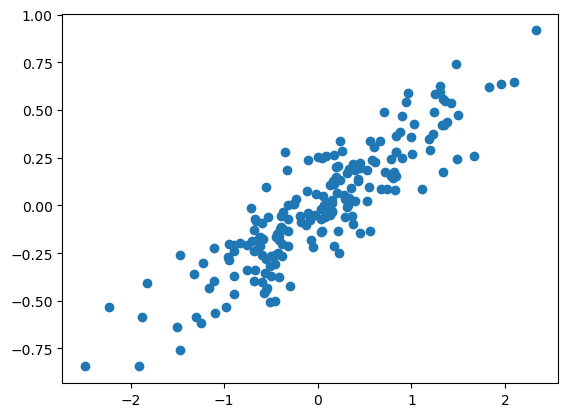

In [41]:
x = np.array(pca[0].to_list())
y = np.array(pca[1].to_list())

fig, ax = plt.subplots()
ax.scatter(x, y)
plt.show()

In [60]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

#Применение PCA с n_components=2
pca_method = PCA(n_components=2)
principal_components = pca_method.fit_transform(pca)

principal_components

array([[ 6.76769235e-01,  5.97386015e-02],
       [-1.07121393e+00,  2.57240064e-01],
       [ 7.27912364e-01, -1.68669939e-01],
       [ 2.30964136e+00,  2.44066575e-01],
       [ 6.30052323e-01, -3.04655713e-01],
       [ 1.02448887e+00,  7.56230140e-02],
       [ 7.77183507e-01, -8.34608477e-02],
       [-1.39656414e+00,  1.44518385e-01],
       [-2.91049874e-01, -2.01289478e-01],
       [ 1.88864221e+00,  2.31419563e-01],
       [-7.11544293e-01,  1.13426118e-01],
       [ 6.38884130e-01,  3.88212853e-02],
       [ 5.48059617e-01, -2.00775267e-01],
       [-2.19312436e-01,  2.08243673e-01],
       [-3.87789490e-01,  6.89135848e-02],
       [ 7.15219956e-01,  1.13841003e-01],
       [-1.08373816e+00,  7.78081042e-02],
       [-2.99917403e-01, -5.86382919e-02],
       [-7.96849021e-01,  2.44527383e-01],
       [-8.12568346e-01, -1.17341246e-01],
       [-1.54018281e+00, -3.24862050e-02],
       [-2.52920476e-01, -4.86012463e-02],
       [ 6.26464454e-01, -1.68045678e-01],
       [-1.

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


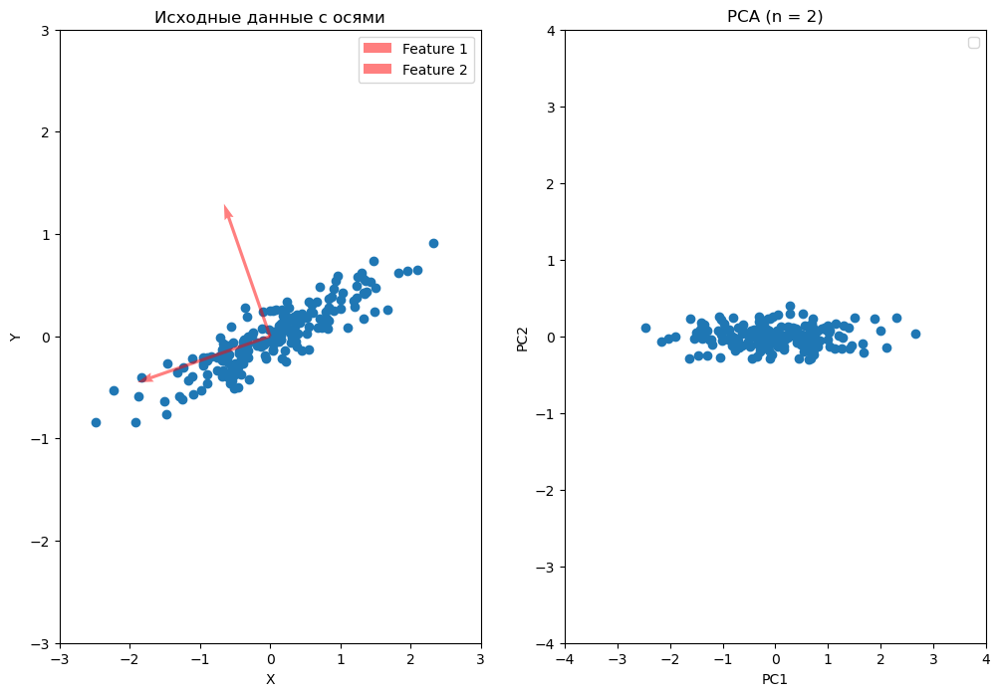

In [61]:
principal_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])

# Визуализация данных с осями проектирования
fig, axs = plt.subplots(1,2, figsize = (12, 8))
axs[0].scatter(x, y)
axs[1].scatter(principal_df['PC1'], principal_df['PC2'])
# Добавление осей
origin = np.zeros((2,))  # начало координат

for i in range(len(pca.columns)):
    axs[0].quiver(*origin, pca_method.components_[0][i], pca_method.components_[1][i], 
               color='r', alpha=0.5, scale=3, label=f'Feature {i+1}')

# Настройка графика
axs[0].set_title('Исходные данные с осями')
axs[0].set_xlabel('X')
axs[0].set_ylabel('Y')
axs[0].set_xlim(-3, 3)
axs[0].set_ylim(-3, 3)
axs[0].legend()

axs[1].set_title('PCA (n = 2)')
axs[1].set_xlabel('PC1')
axs[1].set_ylabel('PC2')
axs[1].set_xlim(-4, 4)
axs[1].set_ylim(-4, 4)
axs[1].legend()

plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


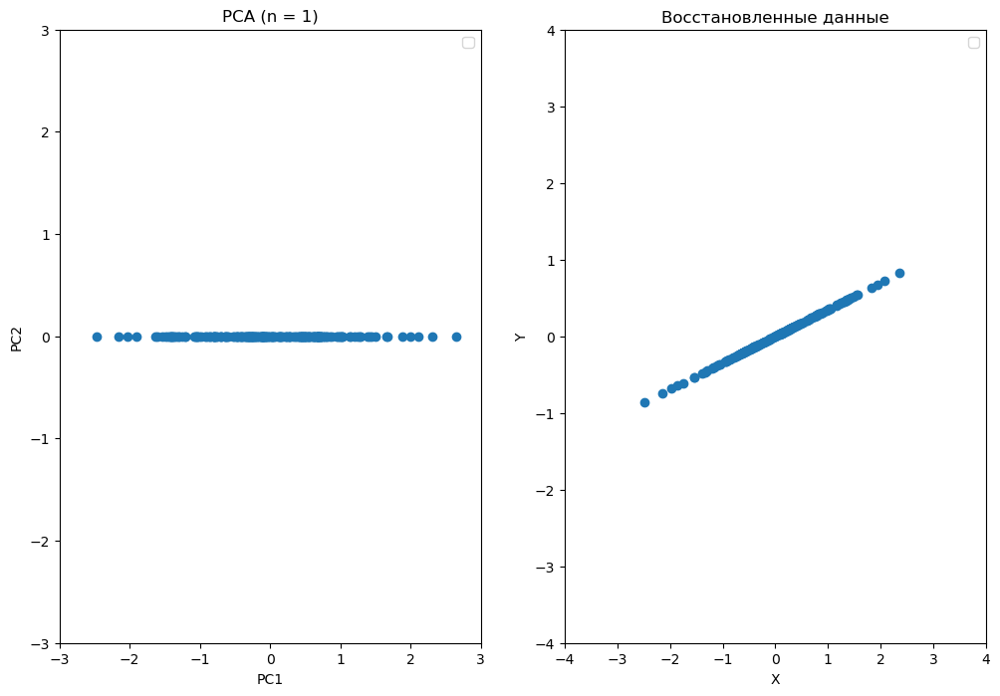

In [79]:
#Применение PCA с n_components=1
pca_method_pc1 = PCA(n_components=1)
principal_components_pc1 = pca_method_pc1.fit_transform(pca)

projections_on_pc1 = np.array(pca.dot(pca_method.components_[0]))[:, np.newaxis] * pca_method.components_[0]
projections_on_pc1_df = pd.DataFrame(data=projections_on_pc1, columns=['X', 'Y'])

principal_df_pc1 = pd.DataFrame(data=principal_components_pc1, columns=['PC1'])


fig, axs = plt.subplots(1,2, figsize = (12, 8))
axs[0].scatter(principal_df_pc1['PC1'], np.zeros(len(principal_df_pc1)))
axs[1].scatter(projections_on_pc1_df['X'], projections_on_pc1_df['Y'])

# Настройка графика
axs[0].set_title('PCA (n = 1)')
axs[0].set_xlabel('PC1')
axs[0].set_ylabel('PC2')
axs[0].set_xlim(-3, 3)
axs[0].set_ylim(-3, 3)
axs[0].legend()

axs[1].set_title('Восстановленные данные')
axs[1].set_xlabel('X')
axs[1].set_ylabel('Y')
axs[1].set_xlim(-4, 4)
axs[1].set_ylim(-4, 4)
axs[1].legend()

plt.show()

# 4

In [81]:
wd = pd.read_csv('wd.data', header = None)
wd

,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,926424,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,926682,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,926954,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,927241,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


In [85]:
wd_label = wd[1]
wd_data = wd.iloc[:,2:]

In [86]:
pca_method = PCA(n_components=2)
pca_wd = pca_method.fit_transform(wd_data)

# Стандартизация данных
scaler = StandardScaler()
scaled_wd = scaler.fit_transform(wd_data)

pca_method_sc = PCA(n_components=2)
pca_wd_sc = pca_method.fit_transform(scaled_wd)

In [88]:
labels = np.array(wd_label)
colors = np.where(labels == 'M', 'red', 'green')

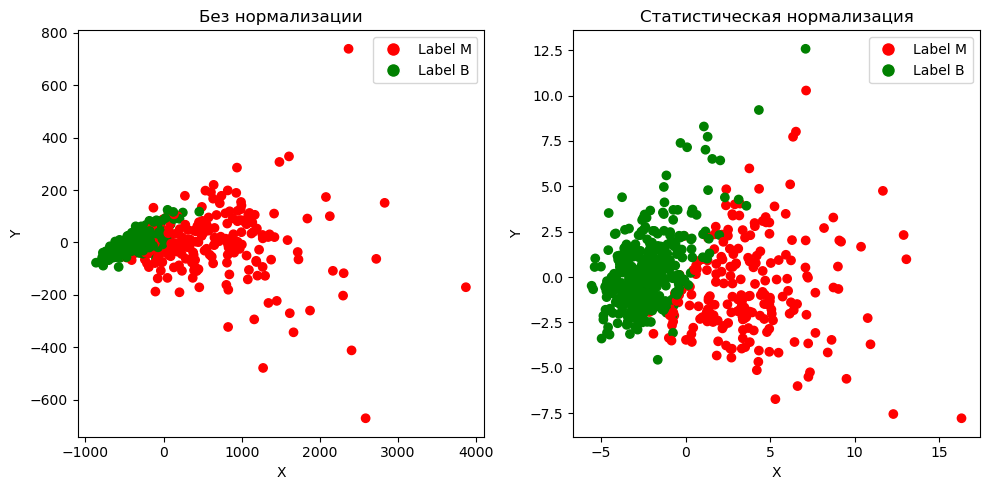

In [90]:
principal_df = pd.DataFrame(data=pca_wd, columns=['PC1', 'PC2'])
principal_df_scaled = pd.DataFrame(data=pca_wd_sc, columns=['PC1', 'PC2'])

fig, axs = plt.subplots(1,2, figsize = (10,5))

legend_elements = [
    Line2D([0], [0], marker='o', color='w', label='Label M', markerfacecolor='red', markersize=10),
    Line2D([0], [0], marker='o', color='w', label='Label B', markerfacecolor='green', markersize=10),
]

axs[0].scatter(principal_df['PC1'], principal_df['PC2'], c=colors, label=['Label 1', 'Label 2'])
axs[0].set_title('Без нормализации')
axs[0].set_xlabel('X')
axs[0].set_ylabel('Y')
axs[0].legend(handles=legend_elements)

axs[1].scatter(principal_df_scaled['PC1'], principal_df_scaled['PC2'], c=colors, label=['Label 1', 'Label 2'])
axs[1].set_title('Статистическая нормализация')
axs[1].set_xlabel('X')
axs[1].set_ylabel('Y')
axs[1].legend(handles=legend_elements)


plt.tight_layout()
plt.show()

# 5

In [91]:
wdbc = pd.read_csv('wdbc.data', header = None)
wdbc

,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,926424,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,926682,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,926954,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,927241,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


In [94]:
wdbc_label = wdbc[1]
wdbc_data = wdbc.iloc[:,2:]

In [95]:
# Применяем PCA
pca = PCA()
pca.fit(wdbc_data)

PCA()

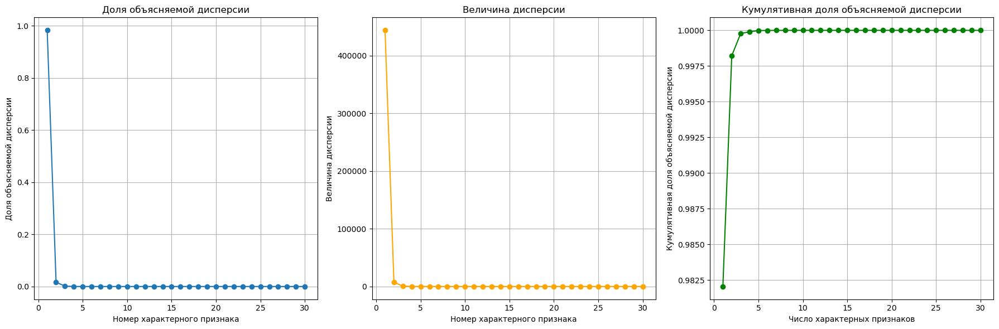

In [107]:
explained_variance = pca.explained_variance_ratio_

fig, axs = plt.subplots(1, 3, figsize = (18, 6))
axs[0].plot(np.arange(1, len(explained_variance) + 1), explained_variance, marker='o')
axs[0].set_title('Доля объясняемой дисперсии')
axs[0].set_xlabel('Номер характерного признака')
axs[0].set_ylabel('Доля объясняемой дисперсии')
axs[0].grid()

# График зависимости величины дисперсии
axs[1].plot(np.arange(1, len(explained_variance) + 1), pca.explained_variance_, marker='o', color='orange')
axs[1].set_title('Величина дисперсии')
axs[1].set_xlabel('Номер характерного признака')
axs[1].set_ylabel('Величина дисперсии')
axs[1].grid()

# Кумулятивная доля объясняемой дисперсии
cumulative_explained_variance = np.cumsum(explained_variance)

axs[2].plot(np.arange(1, len(cumulative_explained_variance) + 1), cumulative_explained_variance, marker='o', color='green')
axs[2].set_title('Кумулятивная доля объясняемой дисперсии')
axs[2].set_xlabel('Число характерных признаков')
axs[2].set_ylabel('Кумулятивная доля объясняемой дисперсии')
axs[2].grid()

plt.tight_layout()
plt.show()

# 6

In [2]:
data = pd.read_csv('optical+recognition+of+handwritten+digits/optdigits.tra', header=None)
data

,0,1,2,3,4,5,6,7,8,9,...,55,56,57,58,59,60,61,62,63,64
0,0,1,6,15,12,1,0,0,0,7,...,0,0,0,6,14,7,1,0,0,0
1,0,0,10,16,6,0,0,0,0,7,...,0,0,0,10,16,15,3,0,0,0
2,0,0,8,15,16,13,0,0,0,1,...,0,0,0,9,14,0,0,0,0,7
3,0,0,0,3,11,16,0,0,0,0,...,0,0,0,0,1,15,2,0,0,4
4,0,0,5,14,4,0,0,0,0,0,...,0,0,0,4,12,14,7,0,0,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3818,0,0,5,13,11,2,0,0,0,2,...,0,0,0,8,13,15,10,1,0,9
3819,0,0,0,1,12,1,0,0,0,0,...,0,0,0,0,4,9,0,0,0,4
3820,0,0,3,15,0,0,0,0,0,0,...,0,0,0,4,14,16,9,0,0,6
3821,0,0,6,16,2,0,0,0,0,0,...,0,0,0,5,16,16,16,5,0,6


In [3]:
data[63].unique()

array([ 0,  6, 16,  3, 12,  5,  1,  4,  2, 13, 14, 11, 15,  7,  9,  8])

In [4]:
def img(data):
    data = np.array(data).reshape((8, 8)) 
    # Создаем 32x32 изображение
    image = np.zeros((32, 32))
    
    # Наполняем 32x32 изображение на основе 8x8 матрицы
    for i in range(8):
        for j in range(8):
            block_value = data[i, j]
            # Заполняем 4x4 блок
            for x in range(4):
                for y in range(4):
                    if (x * 4 + y) < block_value:
                        image[i * 4 + x, j * 4 + y] = 1  # Устанавливаем пиксель как включенный
    
    return image


In [7]:
# Выборка первых 20 изображений
sample_data = data.sample(n=20).reset_index(drop=True)
images = data.iloc[:, :-1]  # Все столбцы, кроме последнего (метка)

In [8]:
images

,0,1,2,3,4,5,6,7,8,9,...,54,55,56,57,58,59,60,61,62,63
0,0,1,6,15,12,1,0,0,0,7,...,0,0,0,0,6,14,7,1,0,0
1,0,0,10,16,6,0,0,0,0,7,...,3,0,0,0,10,16,15,3,0,0
2,0,0,8,15,16,13,0,0,0,1,...,0,0,0,0,9,14,0,0,0,0
3,0,0,0,3,11,16,0,0,0,0,...,0,0,0,0,0,1,15,2,0,0
4,0,0,5,14,4,0,0,0,0,0,...,12,0,0,0,4,12,14,7,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3818,0,0,5,13,11,2,0,0,0,2,...,10,0,0,0,8,13,15,10,1,0
3819,0,0,0,1,12,1,0,0,0,0,...,0,0,0,0,0,4,9,0,0,0
3820,0,0,3,15,0,0,0,0,0,0,...,4,0,0,0,4,14,16,9,0,0
3821,0,0,6,16,2,0,0,0,0,0,...,15,0,0,0,5,16,16,16,5,0


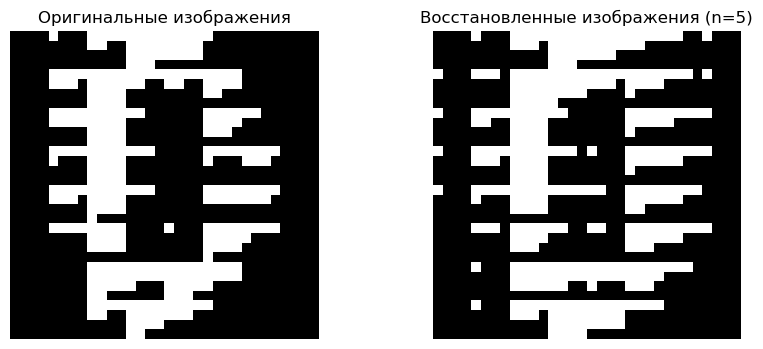

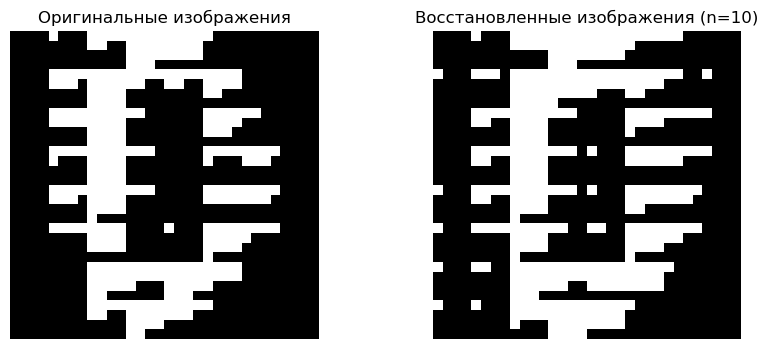

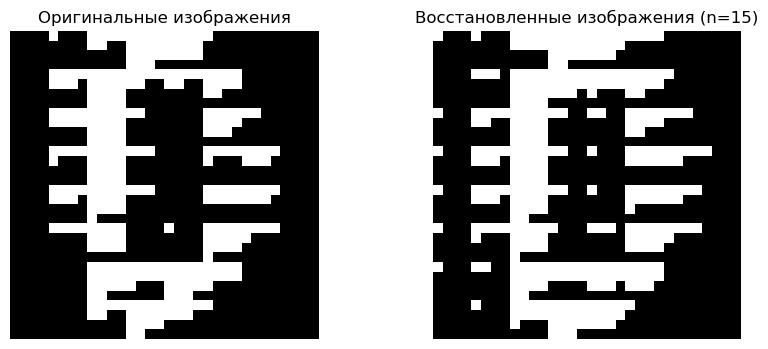

MSE для n=5: 8.640098878727741
MSE для n=10: 4.863369357930092
MSE для n=15: 3.073501959403756


In [17]:
from sklearn.metrics import mean_squared_error
from sklearn.decomposition import PCA
# Инициализация значений n
n_components_list = [5, 10, 15]  # Примеры значений n
mse_list = []

num_digit =  0
for n_components in n_components_list:
    pca = PCA(n_components=n_components)
    # Обучаем PCA на выборке
    images_pca = pca.fit_transform(images)

    # Восстанавливаем изображения
    images_reconstructed = pca.inverse_transform(images_pca)
    
    # Вычисляем среднеквадратичную ошибку (MSE)
    mse = mean_squared_error(images, images_reconstructed)
    mse_list.append(mse)

    # Визуализация оригинального и восстановленного изображения
    plt.figure(figsize=(10, 4))

    # Оригинальное изображение
    plt.subplot(1, 2, 1)
    plt.imshow(img(images.iloc[num_digit,:].values), cmap='gray',interpolation='nearest')
    plt.title('Оригинальные изображения')
    plt.axis('off')

    # Восстановленное изображение
    plt.subplot(1, 2, 2)
    plt.imshow(img(pd.DataFrame(images_reconstructed).iloc[num_digit,:].values), cmap='gray',interpolation='nearest')
    plt.title(f'Восстановленные изображения (n={n_components})')
    plt.axis('off')

    plt.show()

# Вывод среднеквадратичной ошибки
for n, mse in zip(n_components_list, mse_list):
    print(f'MSE для n={n}: {mse}')


00000000000001111000000000000000
00000000000011111110000000000000
00000000001111111111000000000000
00000001111111111111100000000000
00000001111111011111100000000000
00000011111110000011110000000000
00000011111110000000111000000000
00000011111110000000111100000000
00000011111110000000011100000000
00000011111110000000011100000000
00000011111100000000011110000000
00000011111100000000001110000000
00000011111100000000001110000000
00000001111110000000000111000000
00000001111110000000000111000000
00000001111110000000000111000000
00000001111110000000000111000000
00000011111110000000001111000000
00000011110110000000001111000000
00000011110000000000011110000000
00000001111000000000001111000000
00000001111000000000011111000000
00000001111000000000111110000000
00000001111000000001111100000000
00000000111000000111111000000000
00000000111100011111110000000000
00000000111111111111110000000000
00000000011111111111110000000000
00000000011111111111100000000000
00000000001111111110000000000000
0000000000

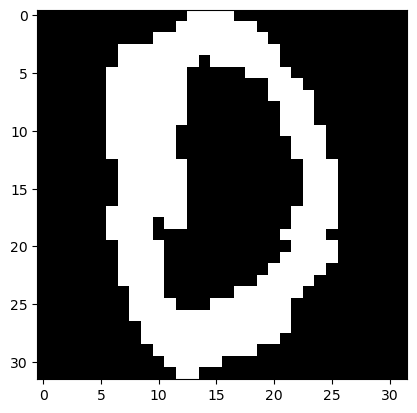

In [24]:
with open('zero.txt', 'r') as file:
    text = file.read()

print(text)
imgg = []
print(len(text))
row = []
for i in range(len(text)):
    if(text[i] != '\n'):
        row.append(int(text[i]))
    else:
        imgg.append(row)
        row = []
imgg = np.array(imgg)
plt.imshow(imgg, cmap='gray',interpolation='nearest')

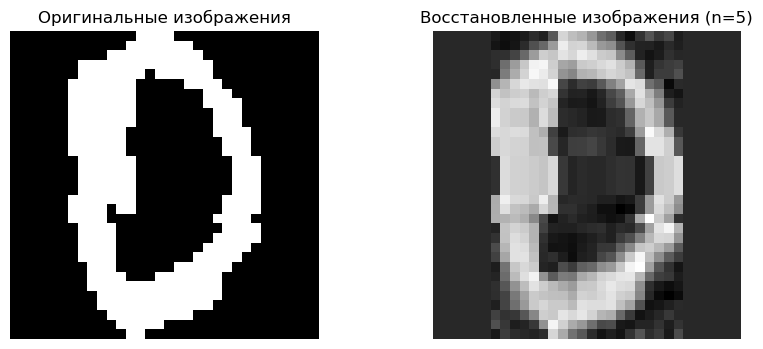

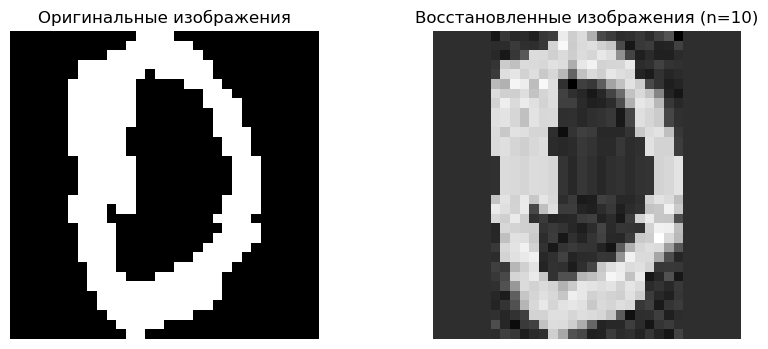

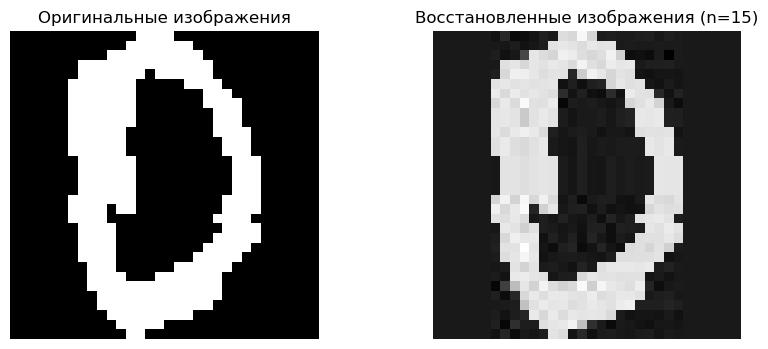

MSE для n=5: 0.018618982138258883
MSE для n=10: 0.005914182191419102
MSE для n=15: 0.0009896428309343532


In [25]:
from sklearn.metrics import mean_squared_error
from sklearn.decomposition import PCA
# Инициализация значений n
n_components_list = [5, 10, 15]  # Примеры значений n
mse_list = []

num_digit =  0
for n_components in n_components_list:
    pca = PCA(n_components=n_components)
    # Обучаем PCA на выборке
    images_pca = pca.fit_transform(imgg)

    # Восстанавливаем изображения
    images_reconstructed = pca.inverse_transform(images_pca)
    
    # Вычисляем среднеквадратичную ошибку (MSE)
    mse = mean_squared_error(imgg, images_reconstructed)
    mse_list.append(mse)

    # Визуализация оригинального и восстановленного изображения
    plt.figure(figsize=(10, 4))

    # Оригинальное изображение
    plt.subplot(1, 2, 1)
    plt.imshow(imgg, cmap='gray',interpolation='nearest')
    plt.title('Оригинальные изображения')
    plt.axis('off')

    # Восстановленное изображение
    plt.subplot(1, 2, 2)
    plt.imshow(images_reconstructed, cmap='gray',interpolation='nearest')
    plt.title(f'Восстановленные изображения (n={n_components})')
    plt.axis('off')

    plt.show()

# Вывод среднеквадратичной ошибки
for n, mse in zip(n_components_list, mse_list):
    print(f'MSE для n={n}: {mse}')

# 7

In [205]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from skimage import io
from skimage.color import rgb2gray
from skimage.util import img_as_float

# Функция для выполнения PCA на изображении
def compress_image(image, n_components):
    # Преобразуем изображение в 2D массив
    #original_shape = image.shape
    #image_reshaped = image.reshape(-1, original_shape[-1])  # reshape для канала цвета, если он есть
    
    # Выполняем PCA
    #print(n_components)
    #print(image_reshaped.shape)
    #print(image.shape)
    pca = PCA(n_components=n_components)
    image_pca = np.zeros((image.shape[0],n_components,image.shape[2]))
    for i in range(3):
        image_pca[:,:,i] = pca.fit_transform(image[:,:,i])
    
    # Восстановление изображения
    restored_image_reshaped = np.zeros(image.shape)
    for i in range(3):
        restored_image_reshaped[:,:,i] = pca.inverse_transform(image_pca[:,:,i])
        #restored_image = restored_image_reshaped.reshape(original_shape)
    if(image.shape[2] == 4):
        restored_image_reshaped[:,:,3] = image[:,:,3]
    return restored_image_reshaped, pca

# Функция для расчета среднеквадратичной ошибки
def mean_squared_error(original, restored):
    return np.mean((original - restored) ** 2)

# Функция для расчета степени сжатия
def compression_ratio(original_shape, n_components, num_features):
    # Размер исходного изображения
    original_size = np.prod(original_shape) * 8  # в битах (1 байт = 8 бит)
    # Количество компонент PCA
    compressed_size = n_components * num_features * 8  # в битах
    return original_size / compressed_size

# Загружаем изображения
lena = img_as_float(io.imread('Lena.png'))
cameraman = img_as_float(io.imread('cameraman.png'))

# Список процентов для PCA
percentages = np.arange(0.05, 1.05, 0.05)
print(percentages)
results = []
lena_compressed_img = []
cameraman_compressed_img  = []
components_cameraman = []
components_lena = []
for percentage in percentages:
    n_components = min(int(percentage * lena.shape[1]),lena.shape[0])
    components_lena.append(n_components)
    #print(percentage)
    #print("LENA")
    #print(lena.shape)
    # Сжимаем и восстанавливаем изображение Lena
    compressed_lena, pca_lena = compress_image(lena, n_components)
    mse_lena = mean_squared_error(lena, compressed_lena)
    compression_lena = compression_ratio(lena.shape, n_components, lena.shape[1])

    #print("cameraman")
    #print(cameraman.shape)
    n_components = int(percentage * cameraman.shape[1])
    components_cameraman.append(n_components)
    # Сжимаем и восстанавливаем изображение Cameraman
    compressed_cameraman, pca_cameraman = compress_image(cameraman, n_components)
    mse_cameraman = mean_squared_error(cameraman, compressed_cameraman)
    compression_cameraman = compression_ratio(cameraman.shape, n_components, cameraman.shape[1])

    #lena_img.append(lena)
    lena_compressed_img.append(compressed_lena)

    #cameraman_img.append(cameraman)
    cameraman_compressed_img.append(compressed_cameraman)
    # Сохраняем результаты
    results.append({
        'percentage': percentage,
        'mse_lena': mse_lena,
        'compression_lena': compression_lena,
        'mse_cameraman': mse_cameraman,
        'compression_cameraman': compression_cameraman
    })

# Вывод результатов
for result in results:
    print(f"Percentage: {result['percentage']*100:.1f}%")
    print(f"  MSE Lena: {result['mse_lena']:.4f}, Compression Ratio Lena: {result['compression_lena']:.2f}")
    print(f"  MSE Cameraman: {result['mse_cameraman']:.4f}, Compression Ratio Cameraman: {result['compression_cameraman']:.2f}")


[0.05 0.1  0.15 0.2  0.25 0.3  0.35 0.4  0.45 0.5  0.55 0.6  0.65 0.7
 0.75 0.8  0.85 0.9  0.95 1.  ]
Percentage: 5.0%
  MSE Lena: 0.0008, Compression Ratio Lena: 69.12
  MSE Cameraman: 0.0029, Compression Ratio Cameraman: 61.25
Percentage: 10.0%
  MSE Lena: 0.0002, Compression Ratio Lena: 34.03
  MSE Cameraman: 0.0011, Compression Ratio Cameraman: 30.62
Percentage: 15.0%
  MSE Lena: 0.0001, Compression Ratio Lena: 22.57
  MSE Cameraman: 0.0005, Compression Ratio Cameraman: 20.14
Percentage: 20.0%
  MSE Lena: 0.0000, Compression Ratio Lena: 16.89
  MSE Cameraman: 0.0003, Compression Ratio Cameraman: 15.15
Percentage: 25.0%
  MSE Lena: 0.0000, Compression Ratio Lena: 13.49
  MSE Cameraman: 0.0001, Compression Ratio Cameraman: 12.15
Percentage: 30.0%
  MSE Lena: 0.0000, Compression Ratio Lena: 11.29
  MSE Cameraman: 0.0001, Compression Ratio Cameraman: 10.07
Percentage: 35.0%
  MSE Lena: 0.0000, Compression Ratio Lena: 9.66
  MSE Cameraman: 0.0000, Compression Ratio Cameraman: 8.65
Perce

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


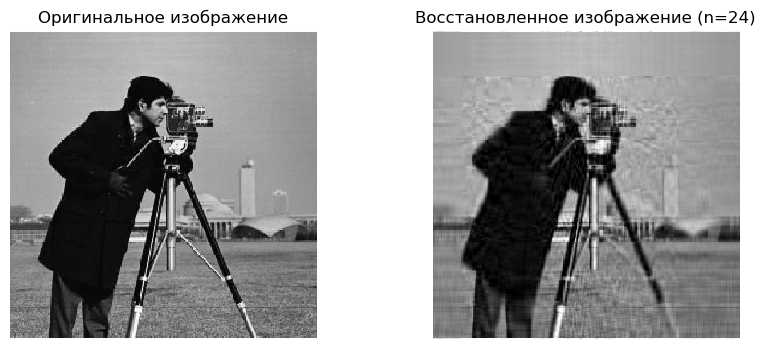

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


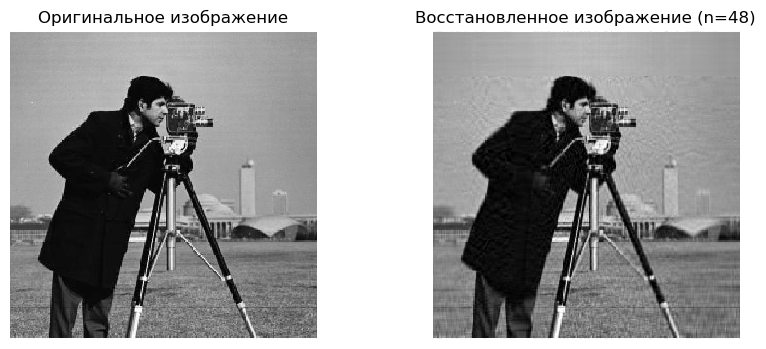

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


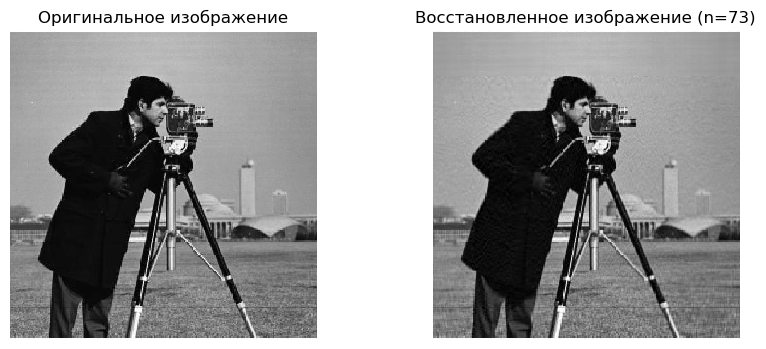

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


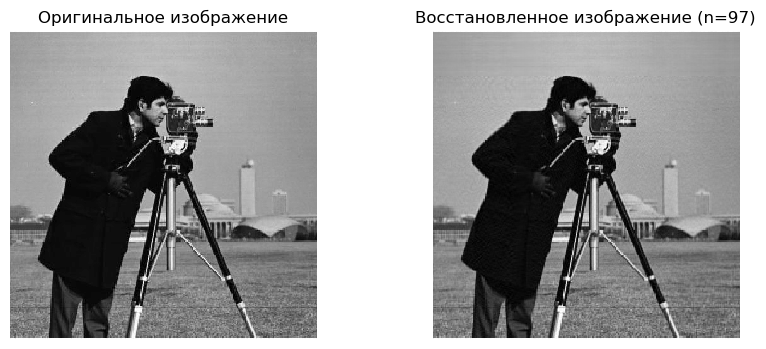

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


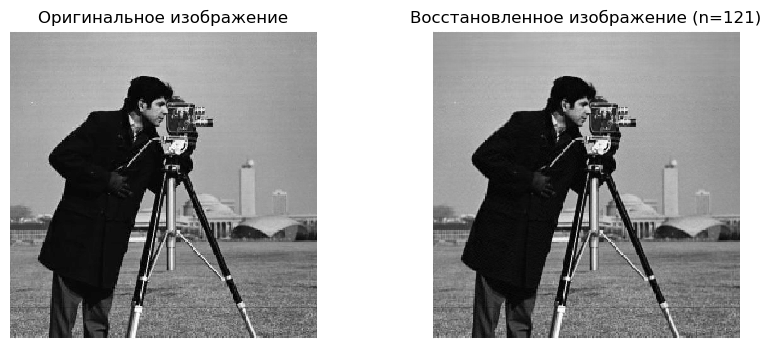

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


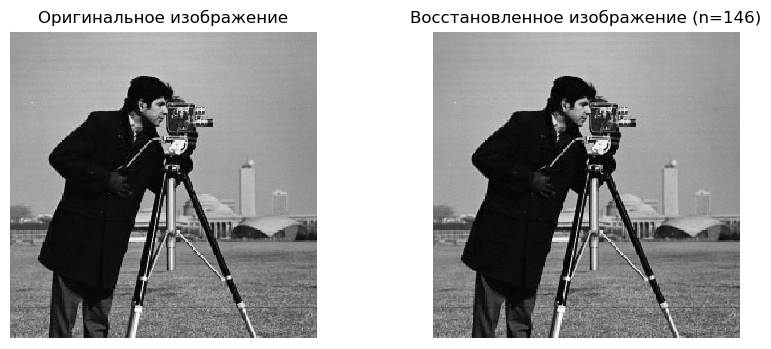

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


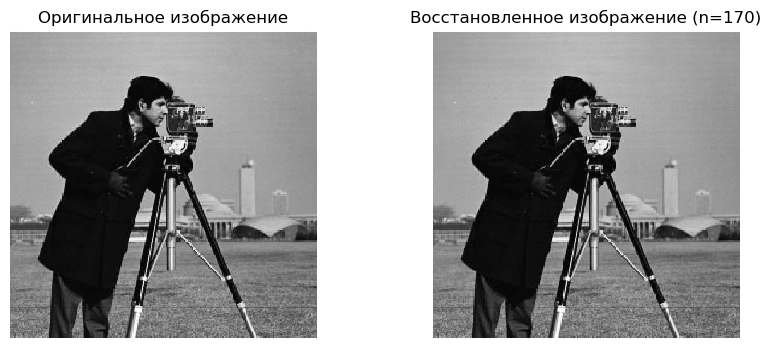

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


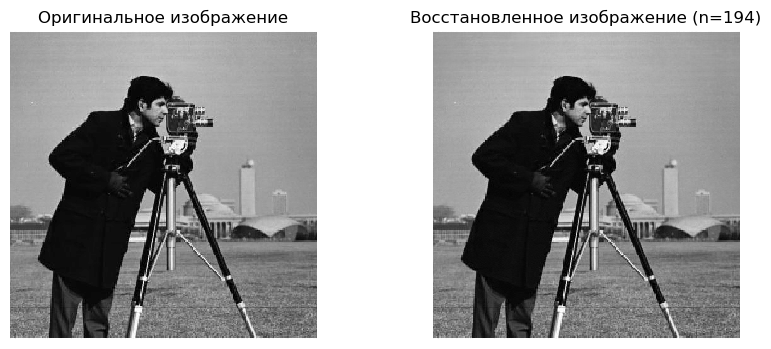

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


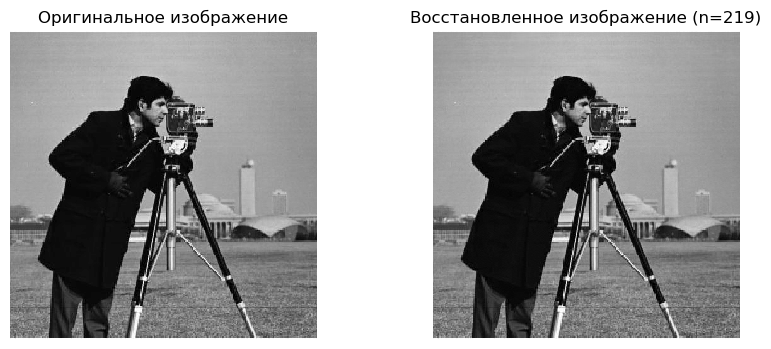

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


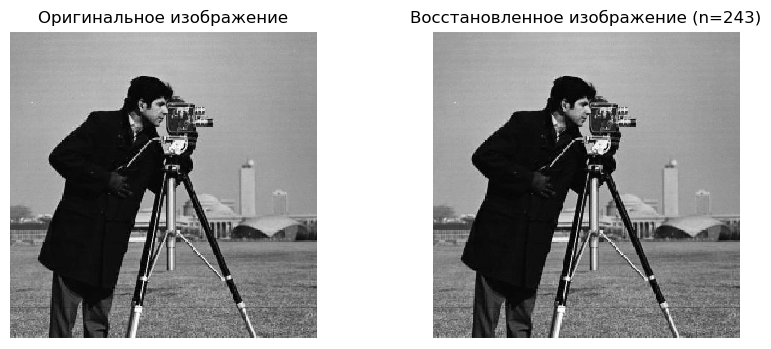

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


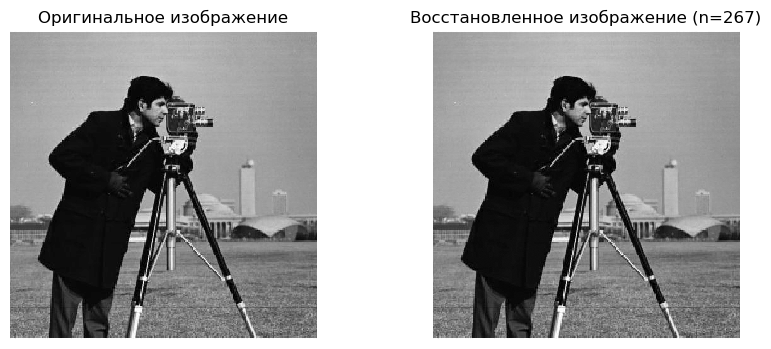

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


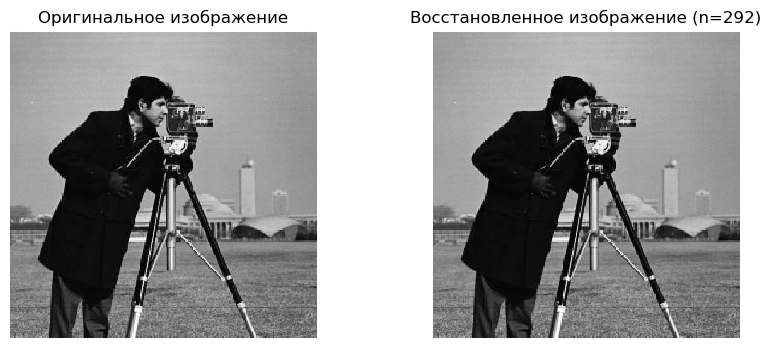

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


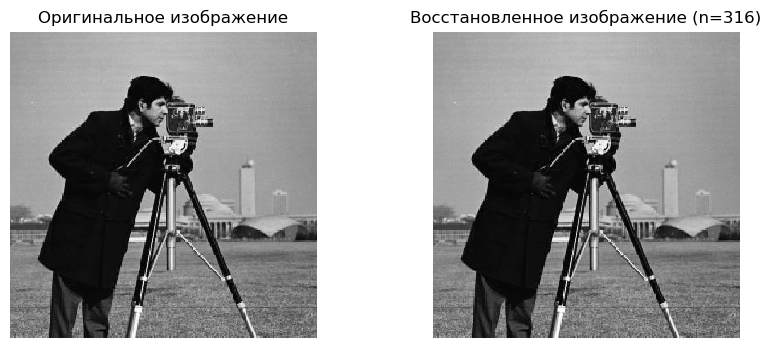

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


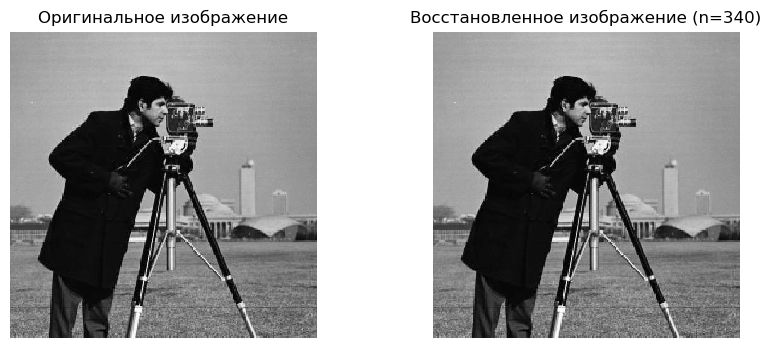

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


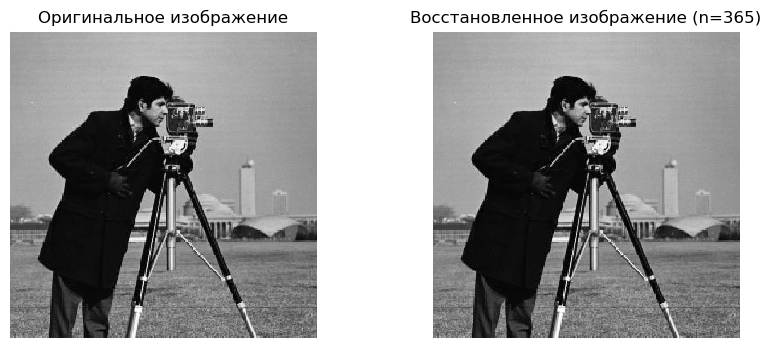

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


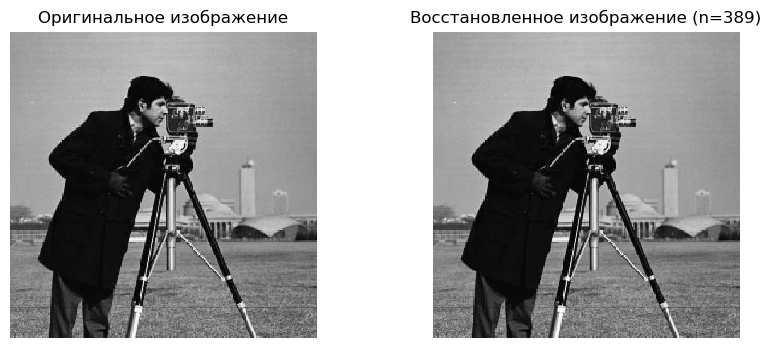

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


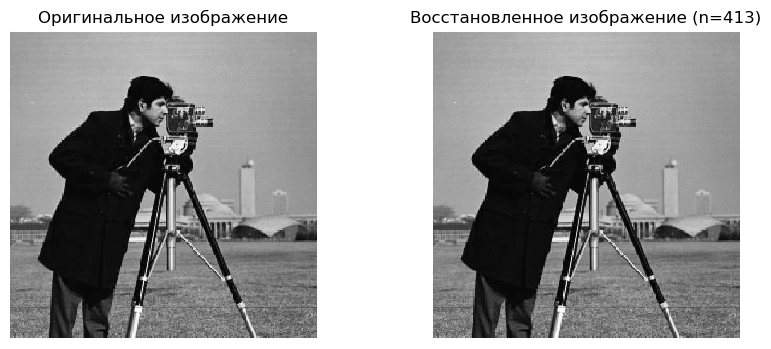

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


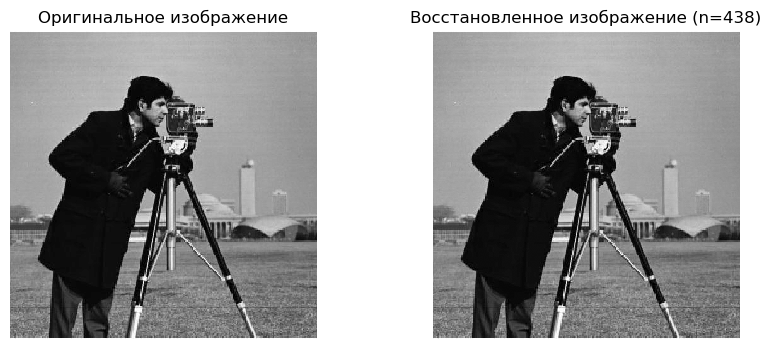

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


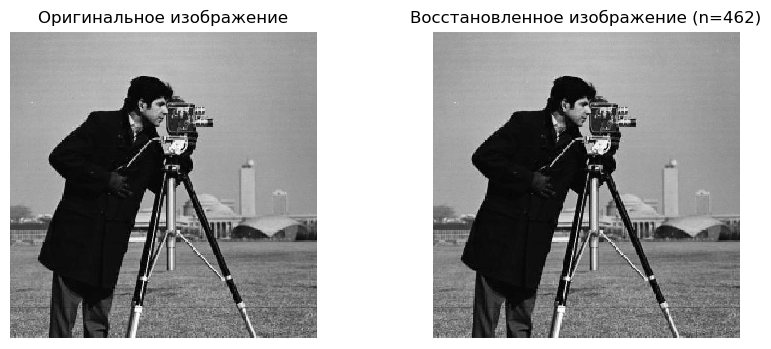

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


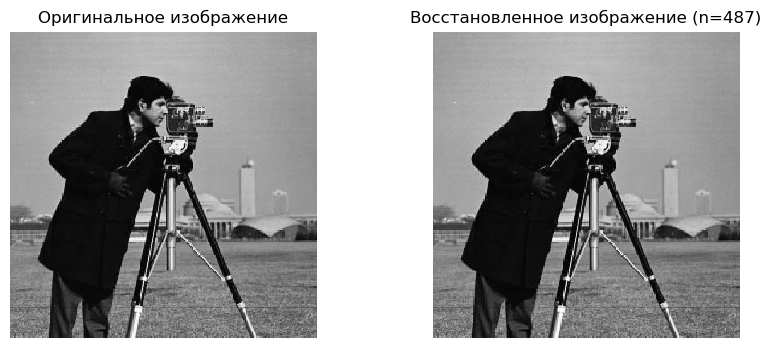

In [209]:
for i in range(len(cameraman_compressed_img)):
    plt.figure(figsize=(10, 4))

    # Оригинальное изображение
    plt.subplot(1, 2, 1)
    plt.imshow(cameraman, cmap='gray',interpolation='nearest')
    plt.title('Оригинальное изображение')
    plt.axis('off')

    # Восстановленное изображение
    plt.subplot(1, 2, 2)
    plt.imshow(cameraman_compressed_img[i], cmap='gray',interpolation='nearest')
    plt.title(f'Восстановленное изображение (n={components_cameraman[i]})')
    plt.axis('off')

    plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


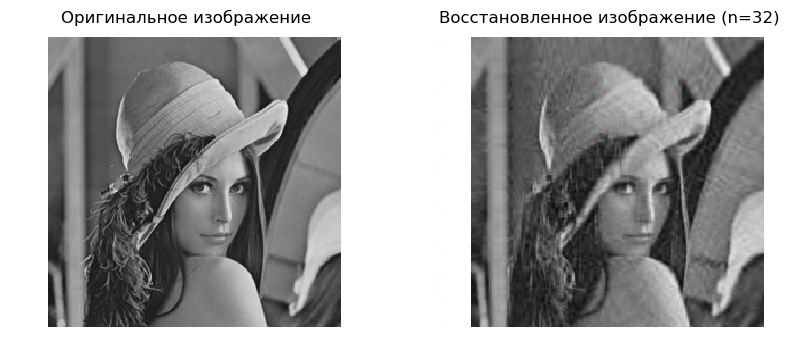

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


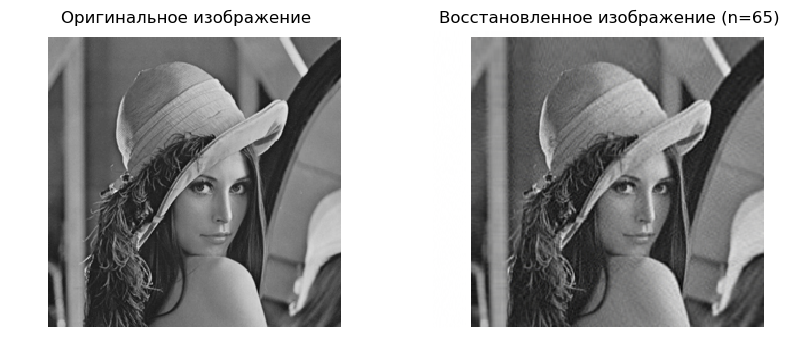

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


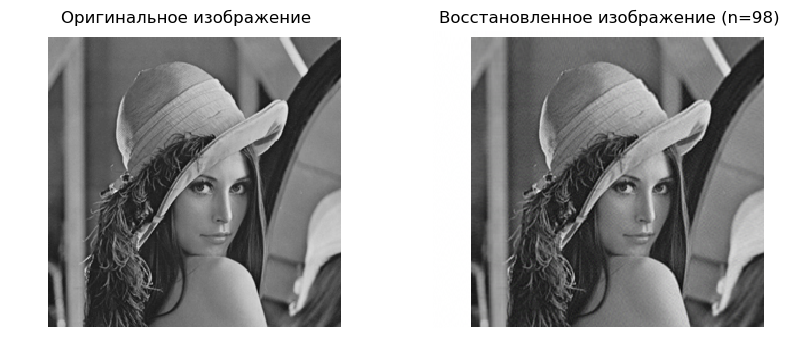

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


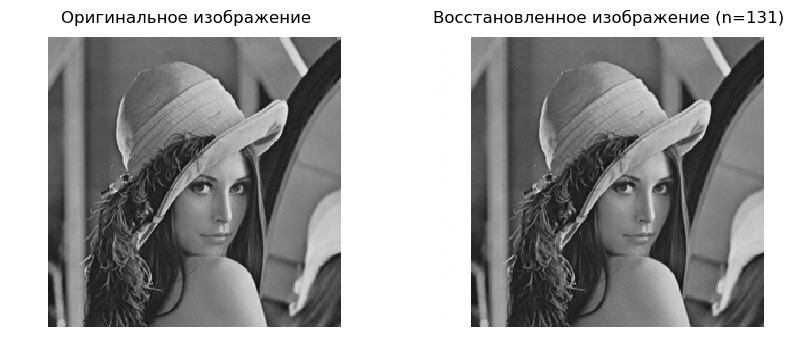

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


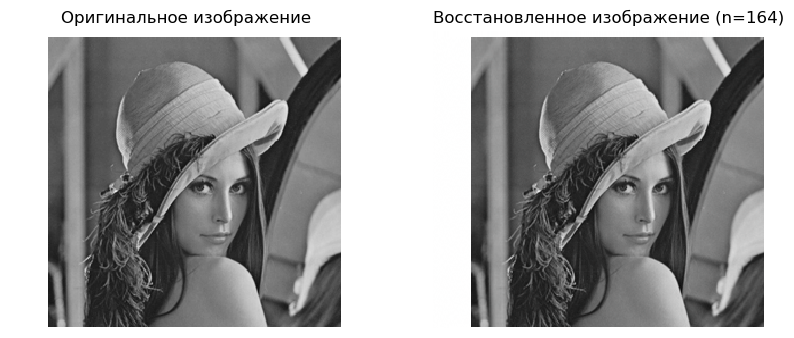

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


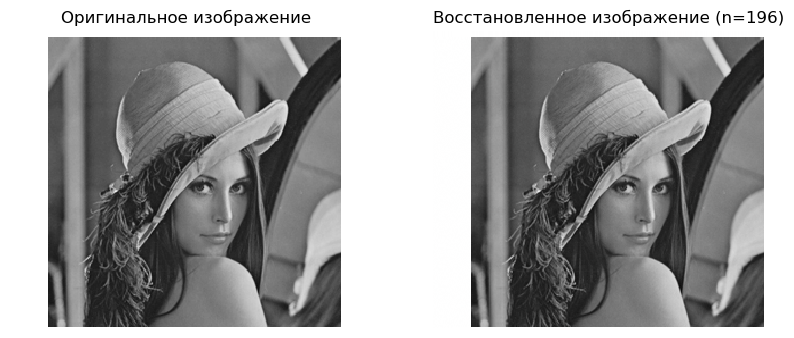

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


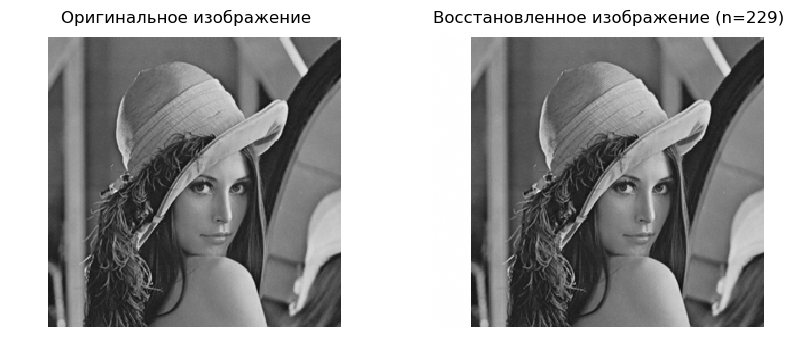

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


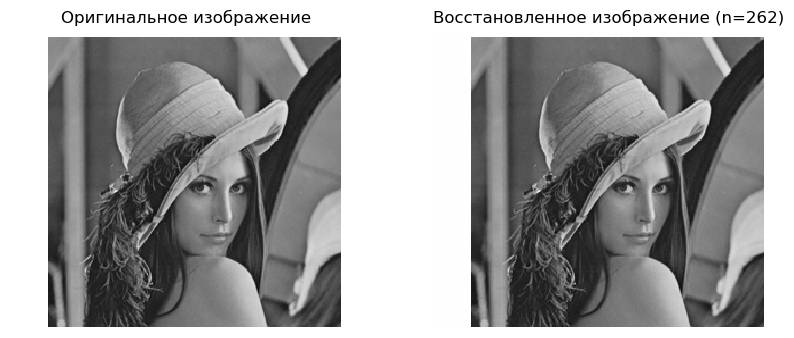

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


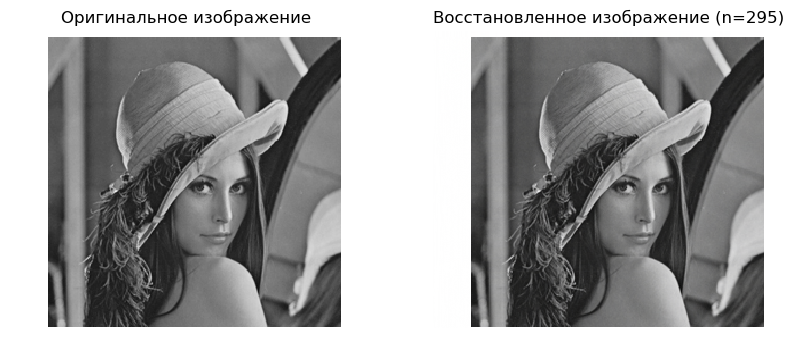

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


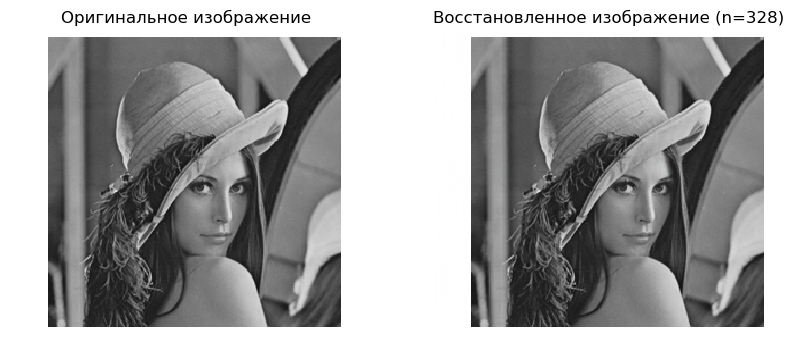

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


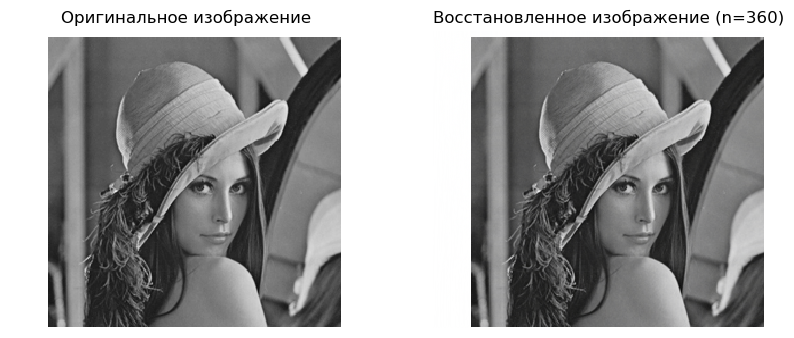

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


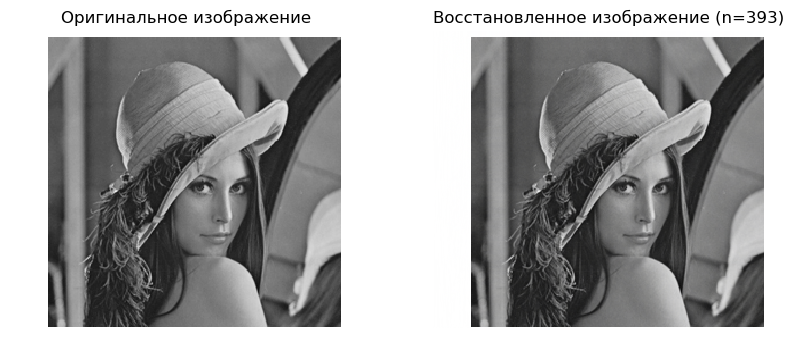

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


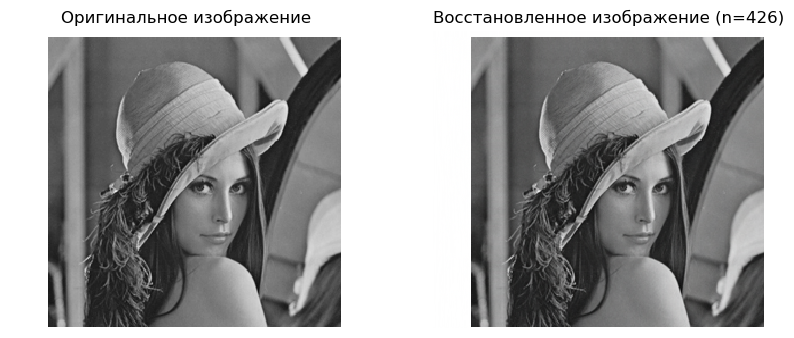

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


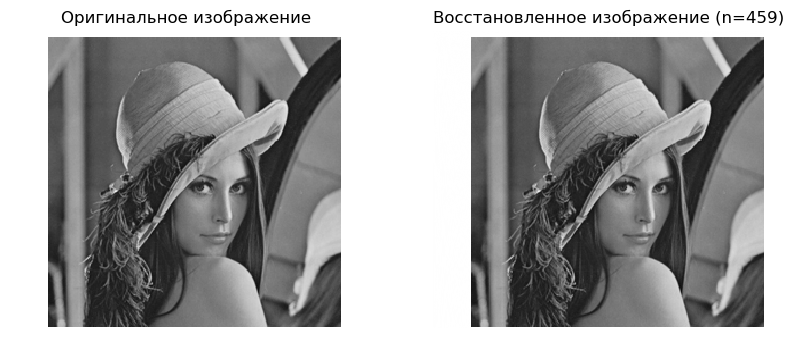

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


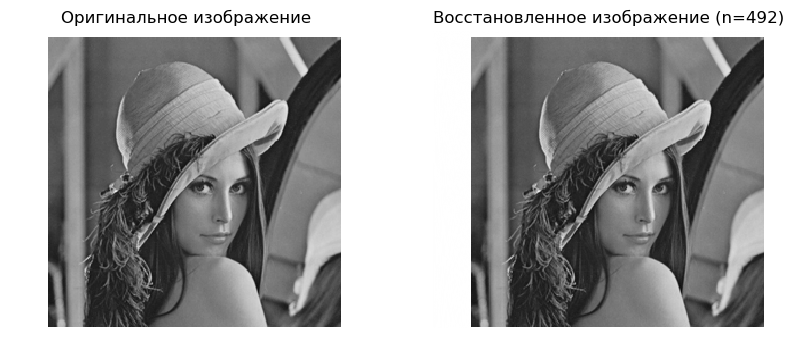

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


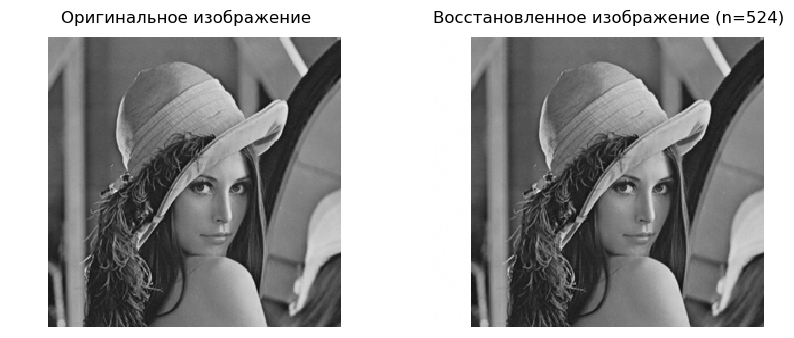

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


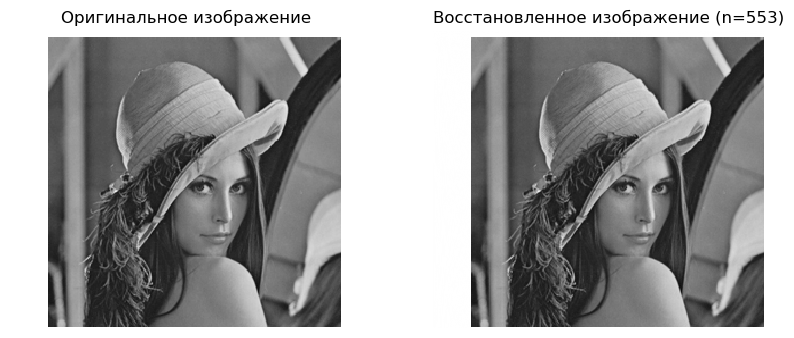

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


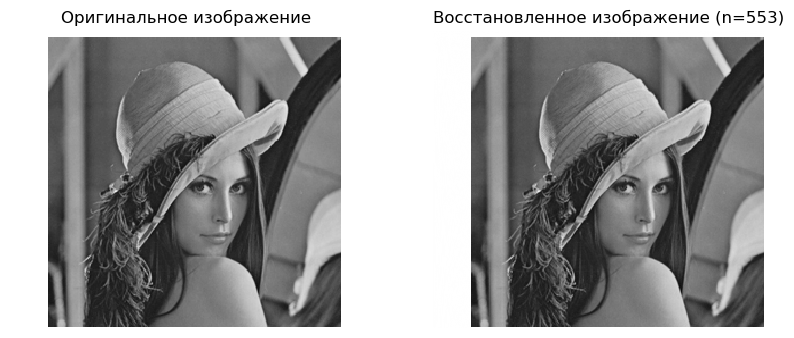

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


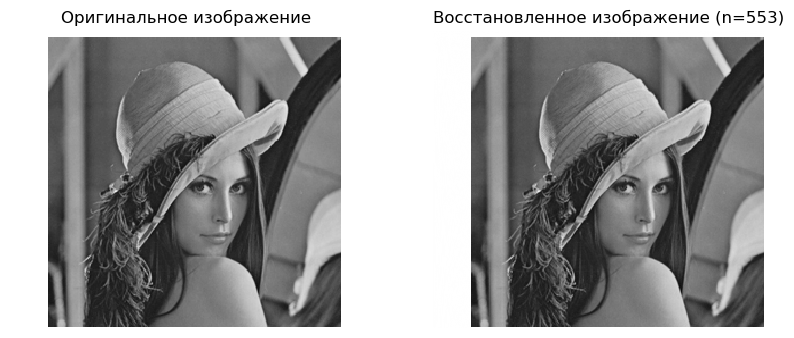

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


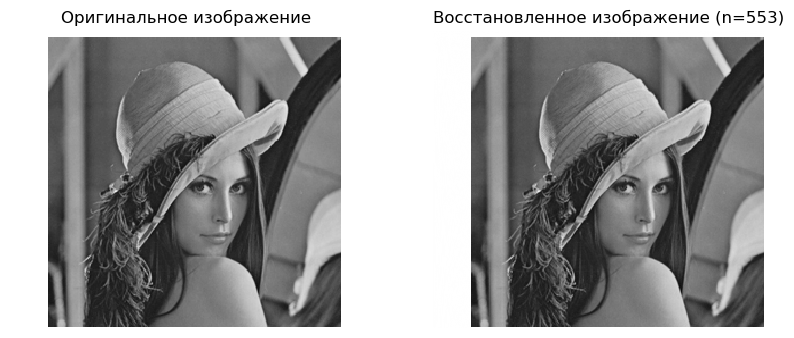

In [210]:
for i in range(len(cameraman_compressed_img)):
    plt.figure(figsize=(10, 4))

    # Оригинальное изображение
    plt.subplot(1, 2, 1)
    plt.imshow(lena, cmap='gray',interpolation='nearest')
    plt.title('Оригинальное изображение')
    plt.axis('off')

    # Восстановленное изображение
    plt.subplot(1, 2, 2)
    plt.imshow(lena_compressed_img[i], cmap='gray',interpolation='nearest')
    plt.title(f'Восстановленное изображение (n={components_lena[i]})')
    plt.axis('off')

    plt.show()